In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

In [ ]:
import numpy as np

In [ ]:
import pandas as pd

In [ ]:
from google.colab import files

In [ ]:
uloaded = files.upload()

Saving cashier.wav to cashier.wav
Saving city.wav to city.wav
Saving nature.wav to nature.wav
Saving speech.wav to speech.wav
Saving vivaldi.wav to vivaldi.wav


In [ ]:
files = {
    "vivaldi": "vivaldi.wav",
    "speech": "speech.wav",
    "city": "city.wav",
    "nature": "nature.wav",
    "cashier": "cashier.wav"
}

signals = {}

for name, path in files.items():
    y, sr = librosa.load(path, sr=22050)
    signals[name] = (y, sr)

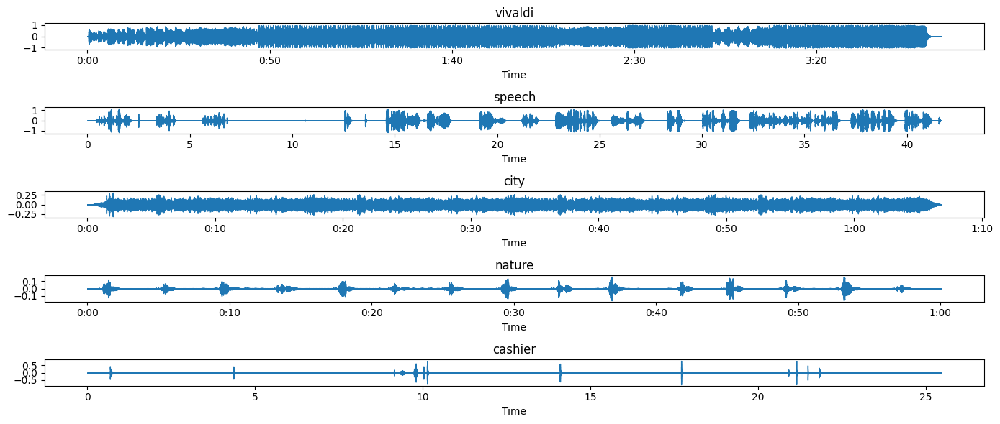

In [ ]:
plt.figure(figsize=(14, 6))

for i, (name, (y, sr)) in enumerate(signals.items(), 1):
    plt.subplot(5, 1, i)
    librosa.display.waveshow(y, sr=sr)
    plt.title(name)

plt.tight_layout()
plt.show()

Это мы визаулизировали аудиосигнал в виде волны (waveform). По оси X - время. По оси Y - амплитуда (высота волны/громкость звука).

Мы видим разные по длине аудиозаписи. Также **данная визуализация даёт общее представление о звуке**:
- для аудио cashier (кассовый аппарат) чётко видны промежутки тишины и примерно одинаковой амплитуды звуки с некоторой периодичностью;
- музыка (vivaldi) и запись городского шума (city) не содержат промежутков тишины, что вполне объяснимо. Шум города выглядит довольно стабильным, амплитуда варьируется в относительно небольшом диапазоне. Визуализация вальса Вивальди отображает структуру музыки (на протяжении определенного отрезка звук имеет одинаковую амплитуду, на другом отрезке - другую);
- для аудио speech (запись речи человека) тоже вполне логичная визуализация: человек то молчит, то говорит, причём чёткой структуры, как у музыки, нет.

**Основные статистические признаки аудиосигнала.**

**spectral_centroid**
- показывает «центр масс» спектра;
- если он высокий → сигнал содержит больше высоких частот (ощущается как более «яркий» или «светлый» звук);
- если низкий → звук более «тёмный», басовый;
- здесь берутся среднее (Centroid_Mean) и стандартное отклонение (Centroid_Std) → общая характеристика распределения частот.

**zero_crossing_rate (ZCR)**
- количество пересечений сигнала с нулевой линией;
- высокое значение → сигнал шумный или содержит много высокочастотных компонентов;
- низкое значение → более плавный, тональный звук;
- у нас берётся среднее значение (ZCR_Mean).

**rms (Root Mean Square Energy)**
- среднеквадратичная энергия сигнала;
- связана с воспринимаемой громкостью;
- у нас берётся среднее (RMS_Mean).

**np.min(y) и np.max(y)**
- минимальная и максимальная амплитуда сигнала;
- показывают размах колебаний (насколько сильно сигнал отклоняется от нуля).

In [ ]:
def stat_features(y, sr):
    cent = librosa.feature.spectral_centroid(y=y, sr=sr)
    zcr = librosa.feature.zero_crossing_rate(y)
    rms = librosa.feature.rms(y=y)
    return {
        "Centroid_Mean": np.mean(cent),
        "Centroid_Std": np.std(cent),
        "RMS_Mean": np.mean(rms),
        "min": np.min(y),
        "max": np.max(y),
        "ZCR_Mean": np.mean(zcr)
    }

stats = {name: stat_features(y, sr) for name, (y, sr) in signals.items()}

In [ ]:
stats_df = pd.DataFrame(stats).T
stats_df

,Centroid_Mean,Centroid_Std,RMS_Mean,min,max,ZCR_Mean
vivaldi,2067.473805,549.295224,0.235670,-1.024000,1.062903,0.097414
speech,2449.310582,1285.619134,0.081481,-1.161703,1.176611,0.122401
city,1573.542355,252.729470,0.048708,-0.315152,0.297526,0.076058
nature,3102.249465,998.311918,0.005334,-0.161964,0.160147,0.229366
cashier,1720.420667,1682.755388,0.003510,-0.810673,0.773530,0.089549


## 1. Centroid_Mean — средний спектральный центроид

- Низкие значения → звук глухой, низкочастотный  
- Высокие значения → звук яркий, с преобладанием высоких частот  

Интерпретация по классам:
- nature — самый высокий центроид → много высокочастотного шума (листва, птицы)
- speech — высокий → форманты речи
- vivaldi — средний → сбалансированный спектр
- city — низкий → гул, транспорт, фон
- cashier — ближе к city / vivaldi

Вывод:  
Хороший признак для разделения *природы*, *речи* и *города*.

## 2. Centroid_Std — стандартное отклонение спектрального центроида

Показывает, насколько частотная структура меняется со временем.

Интерпретация:
- Высокое значение → динамичный, изменчивый звук
- Низкое значение → монотонный, стабильный шум

По классам:
- cashier — самый нестабильный звук
- speech — высокая вариативность (естественно для речи)
- nature — умеренно вариативный
- vivaldi — более структурированная
- city — самый стабильный и монотонный

Вывод:  
Отлично отделяет *городской шум* от *речи* и *cashier*.

## 3. RMS_Mean — средняя энергия сигнала (громкость)

RMS (Root Mean Square) отражает энергетическую насыщенность сигнала.

Интерпретация:
- Высокое значение → громкий, плотный сигнал
- Низкое значение → тихий, разреженный

По классам:
- vivaldi — самая высокая энергия
- speech — средняя громкость
- city — ниже средней
- nature — очень тихий
- cashier — самый тихий

Вывод:  
Музыка резко выделяется по этому признаку.

## 4. min / max — минимальная и максимальная амплитуда

Экстремальные значения аудиосигнала.

Интерпретация:
- Широкий диапазон → резкие переходы, высокая динамика
- Узкий диапазон → ровный, фоновый звук

По классам:
- speech, vivaldi — почти полный диапазон [-1, 1]
- city, nature — сжатый диапазон
- cashier — асимметричные пики

Вывод:  
Речь и музыка — наиболее динамичные по амплитуде.

## 5. ZCR_Mean — Zero Crossing Rate

Частота пересечения сигналом нулевого уровня.
- Высокий ZCR → шум, шипение, высокие частоты
- Низкий ZCR → плавный, тональный сигнал

По классам:
- nature — самый высокий ZCR (шумовые компоненты)
- speech — типичное значение для речи
- vivaldi — умеренный
- cashier — ближе к музыкальному
- city — самый низкий (ровный гул)

Вывод:  
ZCR — сильный признак для отделения *природы* от *города* и *музыки*.

## Итоговая характеристика аудио

### Vivaldi
- Высокая RMS
- Средний спектральный центроид
- Умеренный ZCR  
→ плотный, структурированный сигнал

### Speech
- Высокая спектральная вариативность
- Средний ZCR
- Широкий динамический диапазон  
→ информативный и динамичный сигнал

### City
- Низкий центроид
- Минимальный разброс
- Низкий ZCR  
→ монотонный фоновый шум

### Nature
- Самый высокий центроид
- Самый высокий ZCR
- Очень низкая RMS  
→ тихий, шумовой, высокочастотный сигнал

### Cashier
- Максимальная нестабильность спектра
- Низкая энергия
- Средний ZCR  
→ неоднородный класс, сильно зависит от содержания записи

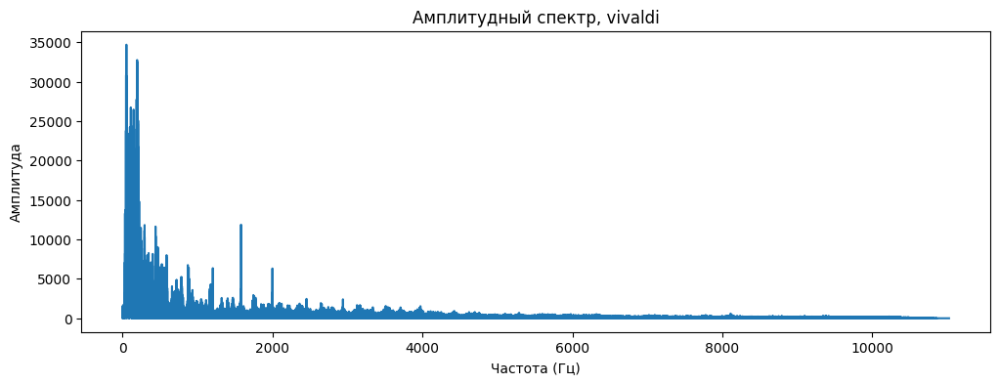

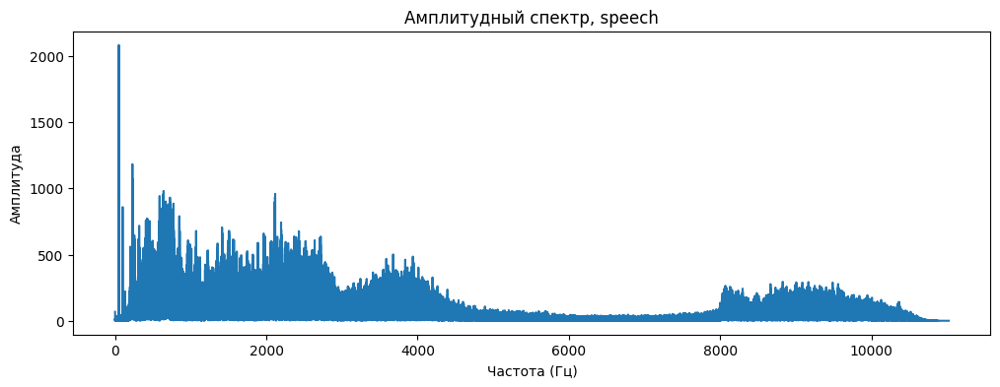

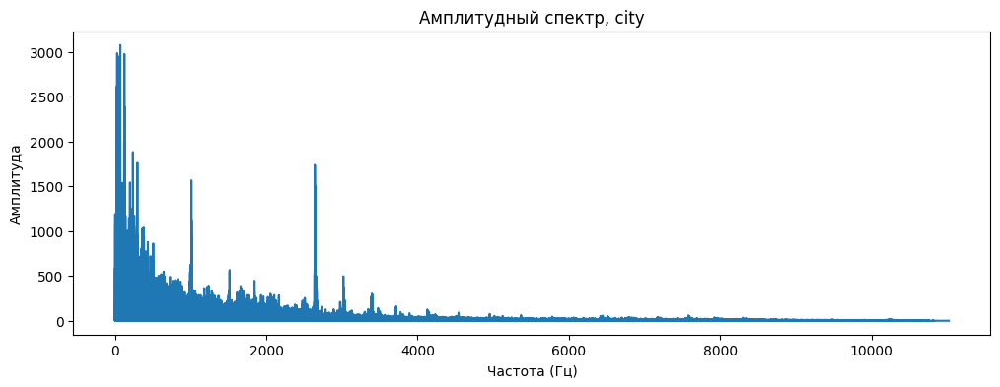

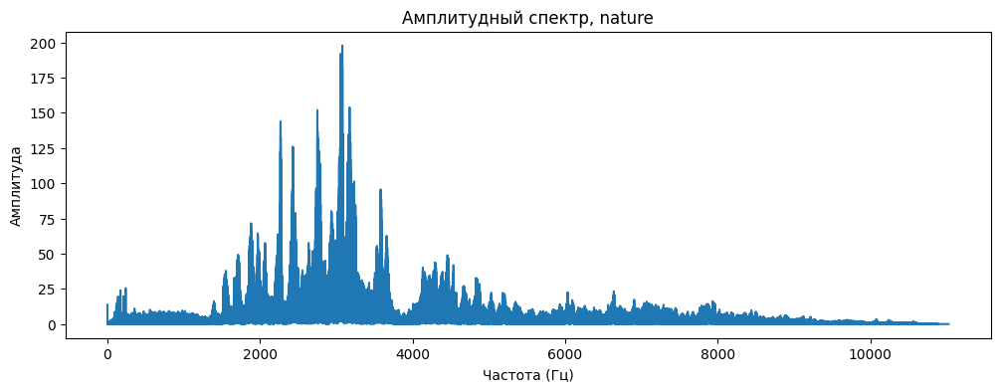

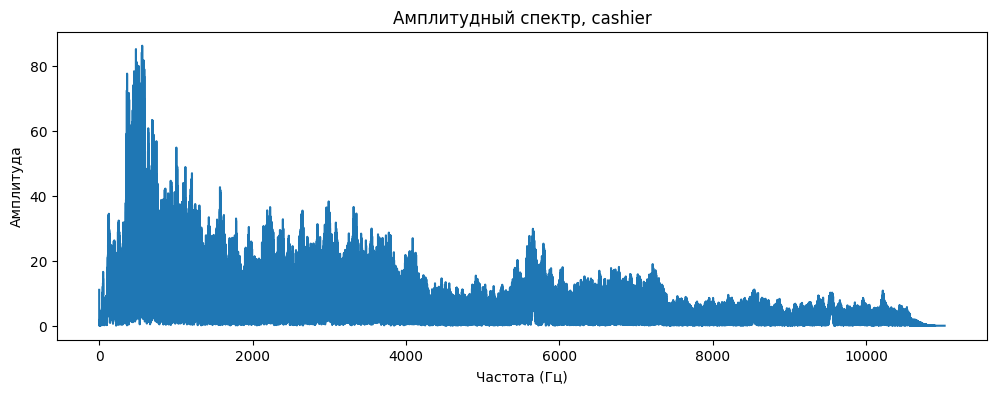

In [ ]:
for i, (name, (y, sr)) in enumerate(signals.items(), 1):
    # FFT
    Y = np.fft.fft(y)
    freqs = np.fft.fftfreq(len(y), 1/sr)

# Берём только положительные частоты
    idx = freqs >= 0

    plt.figure(figsize=(12, 4))
    plt.plot(freqs[idx], np.abs(Y[idx]))
    plt.title(f"Амплитудный спектр, {name}")
    plt.xlabel("Частота (Гц)")
    plt.ylabel("Амплитуда")
    plt.show()

**Интерпретация на примере амплитудного спектра cashier**

Видно, что наибольшая энергия сосредоточена в низких частотах (до ~2000 Гц). Это характерно для фонового гула, голосов и шумов помещений.

В области средних частот есть отдельные пики, которые могут соответствовать звукам речи (согласные, звон монет, сигналы кассы).

В высоких частотах (>6–7 кГц) амплитуда заметно падает → значит, сигнал содержит мало ярких высокочастотных компонентов (нет свиста, резких щелчков).

**Итого:** спектр широкий, но с доминированием низких частот и сильной вариативностью — это соответствует шумной среде магазина, где перемешаны голоса, механические звуки и фоновый гул.

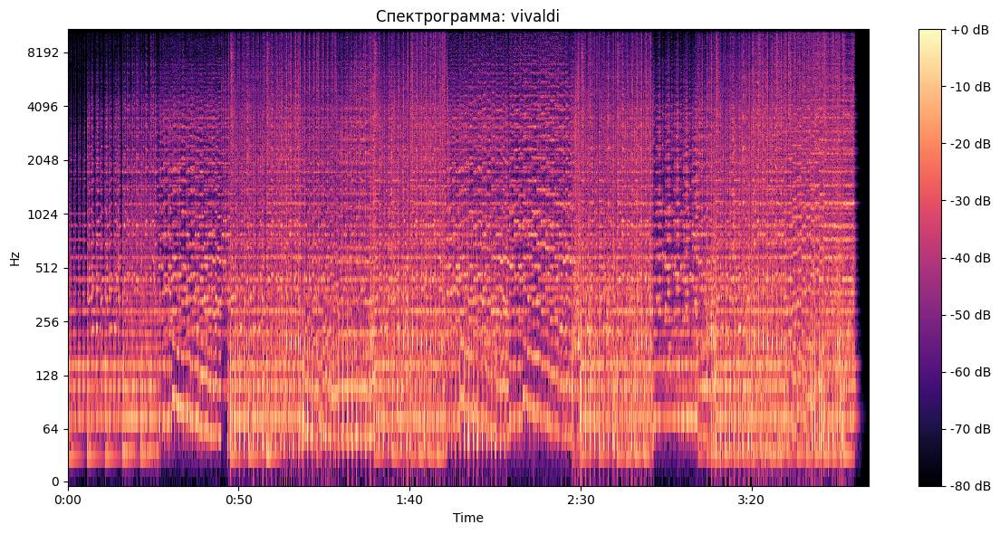

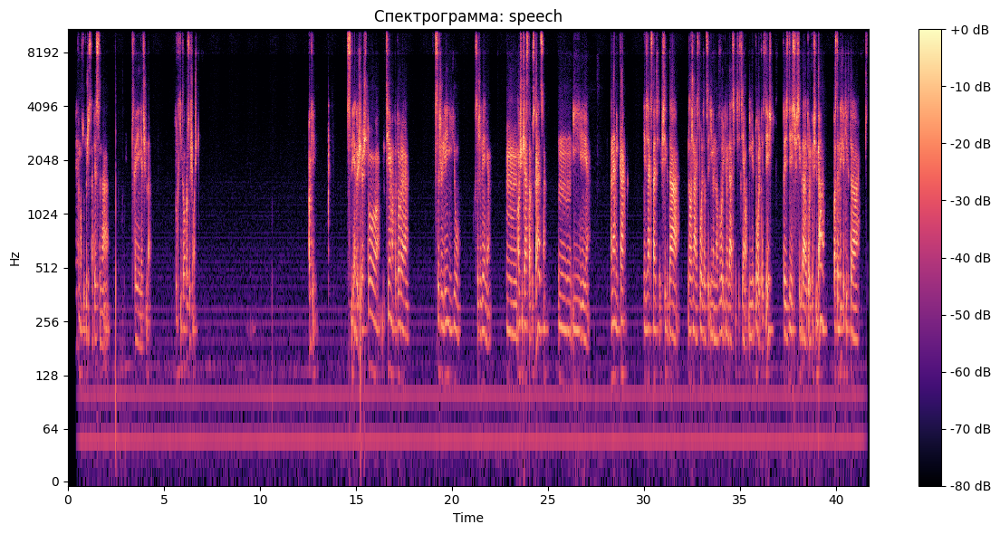

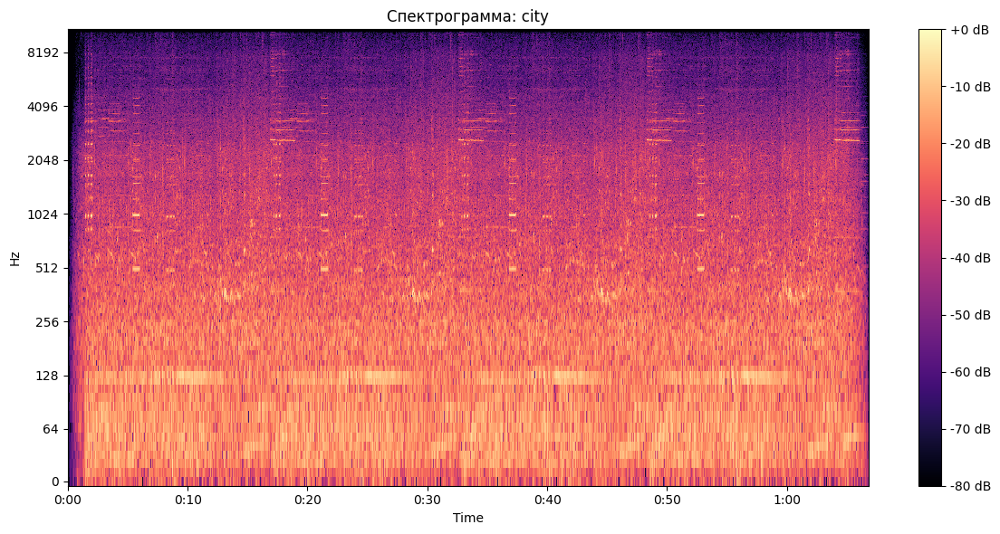

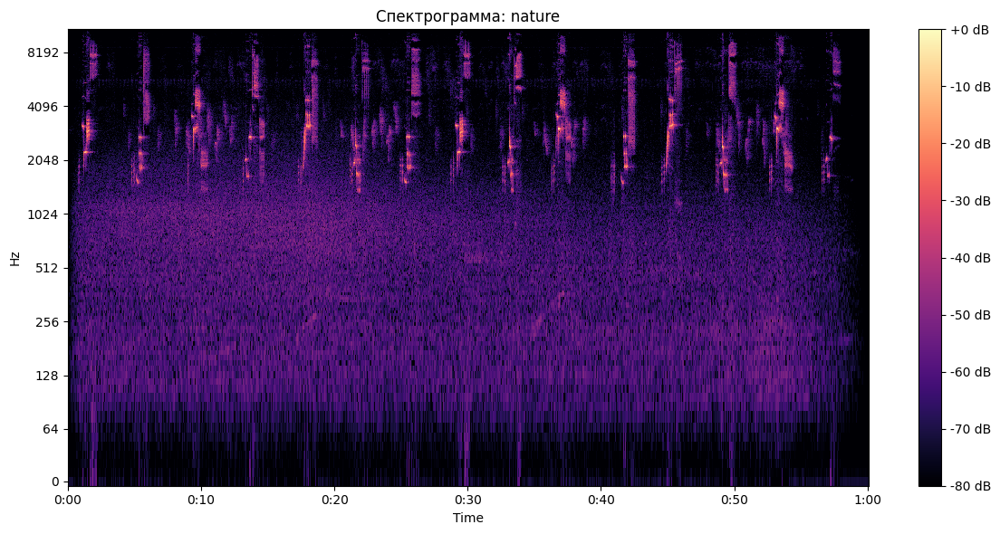

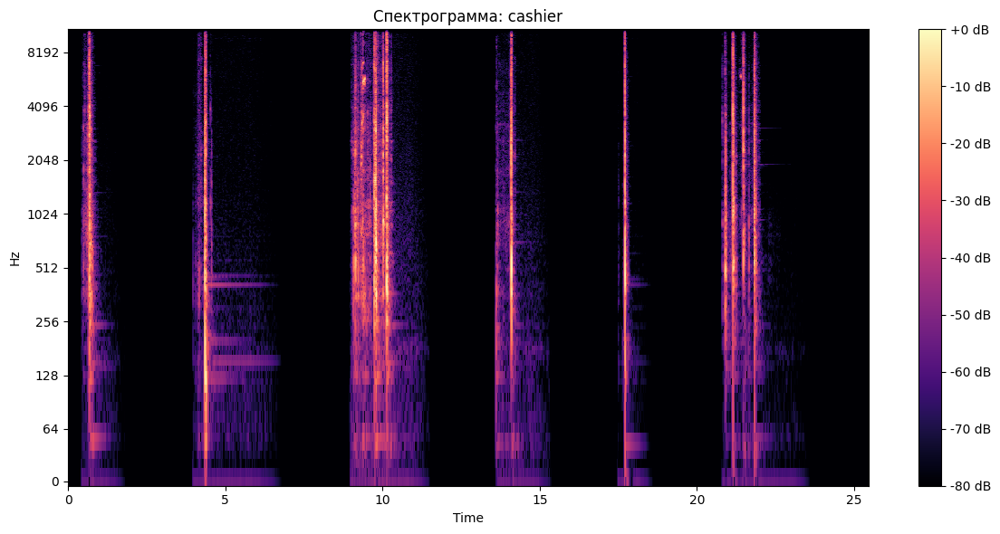

In [ ]:
def compute_stft(y):
    return librosa.stft(y, n_fft=2048, hop_length=512)

# словарь спектрограмм
stfts = {name: compute_stft(y) for name, (y, _) in signals.items()}

# визуализация
for name, stft in stfts.items():
    plt.figure(figsize=(12, 6))

    # переводим комплексные значения в амплитуды (в децибелы)
    D = librosa.amplitude_to_db(np.abs(stft), ref=np.max)


    librosa.display.specshow(D, sr=signals[name][1], hop_length=512,
                             x_axis='time', y_axis='log', cmap='magma')

    plt.colorbar(format='%+2.0f dB')
    plt.title(f"Спектрограмма: {name}")
    plt.tight_layout()
    plt.show()


**Отличие от FFT**: FFT даёт "средний" спектр за всё время, а STFT показывает динамику (как меняется речь, музыка, шум).

**Краткая интерпретация спектрограмм:**

**Speech:**
На спектрограмме видны горизонтальные полосы (форманты) внизу, которые меняются во времени. Согласные дают всплески в высоких частотах.

**Vivaldi**:
Ноты проявляются как горизонтальные линии на определённых частотах. Аккорды → несколько линий одновременно.

**Шум (город, касса)**:
Спектрограмма выглядит «заполненной» во многих частотах сразу, без чётких линий. Это признак шумового сигнала.

**Природа (птицы, шелест)**:
Часто много энергии в высоких частотах, это птички поют.

1. **Спектрограмма мощности**
Что показывает: распределение энергии по частотам во времени.

Как читать:

Светлые области → высокая мощность (громкие частоты).

Тёмные → низкая мощность (тихие или отсутствующие частоты).

Практическая интерпретация: можно увидеть, где в произведении появляются высокочастотные инструменты (например, скрипки), а где доминируют низкие (бас, виолончель).

2.** Mel-спектрограмма**
Что показывает: то же самое, но с частотами преобразованными по шкале Mel (ближе к человеческому восприятию).

Как читать:

Более информативна для анализа восприятия музыки или речи.

Хорошо видно динамику тембра — как меняется окраска звука.

Практическая интерпретация: помогает понять, какие частотные диапазоны наиболее значимы для слуха в разные моменты.

3. **MFCC (Mel-Frequency Cepstral Coefficients)**
Что показывает: компактное представление спектра, часто используемое в машинном обучении для классификации аудио.

Как читать:

Красные/синие области → сильные/слабые значения коэффициентов.

Каждый коэффициент отражает определённый аспект спектральной формы.

Практическая интерпретация: это «отпечаток» звука, который можно использовать для распознавания стиля, инструмента или даже композитора.

4. **STFT, CQT и Chromagram**
STFT: классическая спектрограмма (частоты во времени).

CQT: показывает ноты вместо частот — ближе к музыкальной интерпретации.

Chromagram: сводит всё к 12 классам нот (C–B), полезно для анализа гармонии.

Практическая интерпретация:

STFT → технический анализ.

CQT → какие ноты звучат.

Chromagram → тональность, аккорды, гармоническая структура.

5. **Tempogram и Harmonic vs Percussive**
Tempogram: показывает, как меняется темп (BPM) во времени.

Яркие полосы → устойчивый ритм.

Можно заметить ускорения/замедления.

Harmonic vs Percussive: разделение звука на гармоническую часть (мелодия, аккорды) и перкуссивную (удары, акценты).

Синие линии → гармоника.

Оранжевые → перкуссия.

Практическая интерпретация: помогает понять баланс между мелодией и ритмом.

In [ ]:
# Спектрограмма мощности (берётся квадрат амплитуды; лучше видна разница между тихими и громкими частотами, чем в обычной спектрограмме)
def plot_power_spectrogram(y, sr, name):
    D = np.abs(librosa.stft(y))**2
    S = librosa.amplitude_to_db(D, ref=np.max)
    plt.figure(figsize=(12, 6))
    librosa.display.specshow(S, sr=sr, hop_length=512,
                             x_axis='time', y_axis='log', cmap='magma')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"Спектрограмма мощности: {name}")
    plt.tight_layout()
    plt.show()

In [ ]:
# Mel-спектрограмма
def plot_mel_spectrogram(y, sr, name):
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048,
                                       hop_length=512, n_mels=128)
    S_dB = librosa.amplitude_to_db(S, ref=np.max)
    plt.figure(figsize=(12, 6))
    librosa.display.specshow(S_dB, sr=sr, hop_length=512,
                             x_axis='time', y_axis='mel', cmap='magma')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"Mel-спектрограмма: {name}")
    plt.tight_layout()
    plt.show()

In [ ]:
# MFCC
def plot_mfcc(y, sr, name):
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    plt.figure(figsize=(12, 6))
    librosa.display.specshow(mfccs, sr=sr, x_axis='time')
    plt.colorbar()
    plt.title(f"MFCC: {name}")
    plt.tight_layout()
    plt.show()

In [ ]:
# Разложение аудиосигнала
def signal_decompositions(y, sr, name):
    plt.figure(figsize=(14, 10))

    # STFT
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    plt.subplot(5, 1, 1)
    librosa.display.specshow(D, sr=sr, hop_length=512, x_axis='time', y_axis='log')
    plt.title(f"STFT: {name}")

    # CQT (Constant-Q Transform)
    C = librosa.amplitude_to_db(np.abs(librosa.cqt(y, sr=sr)), ref=np.max)
    plt.subplot(5, 1, 2)
    librosa.display.specshow(C, sr=sr, x_axis='time', y_axis='cqt_note')
    plt.title(f"CQT: {name}")

    # Chromagram
    chroma = librosa.feature.chroma_stft(y=y, sr=sr)
    plt.subplot(5, 1, 3)
    librosa.display.specshow(chroma, sr=sr, x_axis='time', y_axis='chroma')
    plt.title(f"Chromagram: {name}")

    # Wavelet (Tempogram через автокорреляцию)
    oenv = librosa.onset.onset_strength(y=y, sr=sr)
    tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sr)
    plt.subplot(5, 1, 4)
    librosa.display.specshow(tempogram, sr=sr, x_axis='time', y_axis='tempo')
    plt.title(f"Tempogram (Wavelet-like): {name}")

    # Harmonic/Percussive Separation
    y_harm, y_perc = librosa.effects.hpss(y)
    plt.subplot(5, 1, 5)
    plt.plot(y_harm[:2000], label='Harmonic')
    plt.plot(y_perc[:2000], label='Percussive')
    plt.legend()
    plt.title(f"Harmonic vs Percussive: {name}")

    plt.tight_layout()
    plt.show()

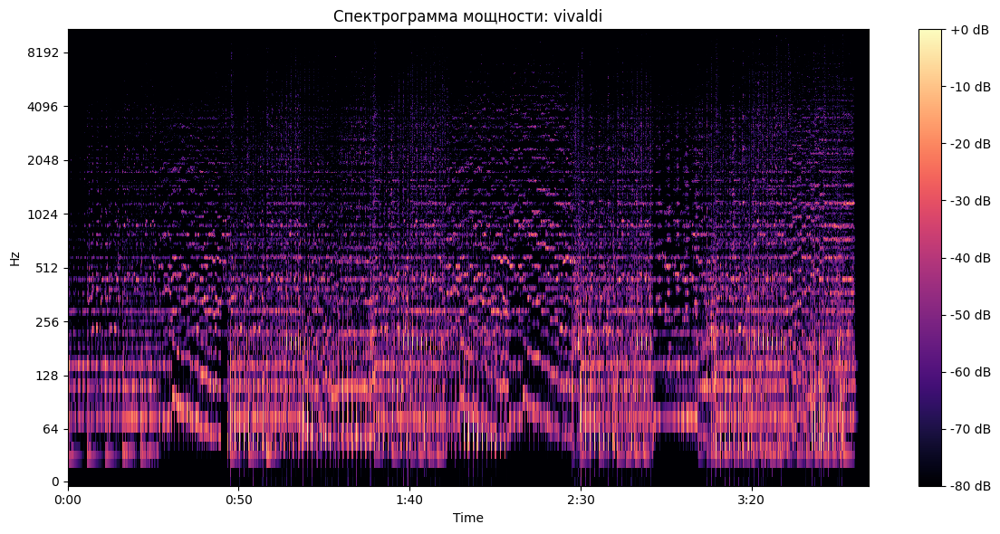

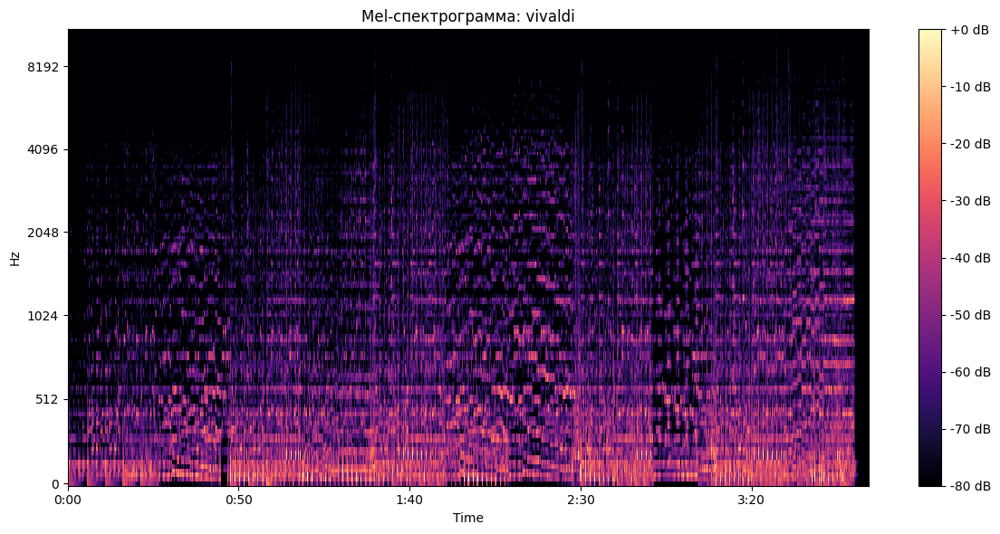

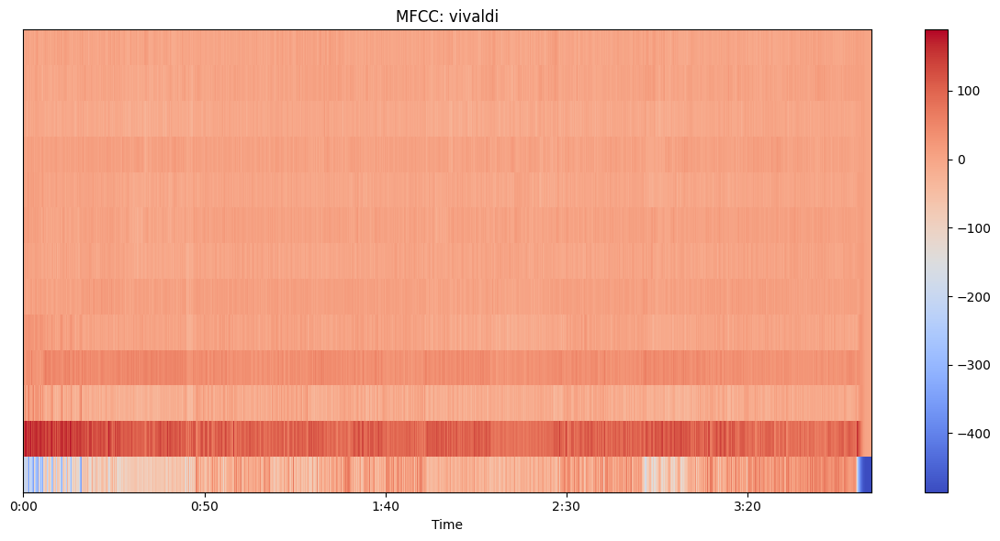

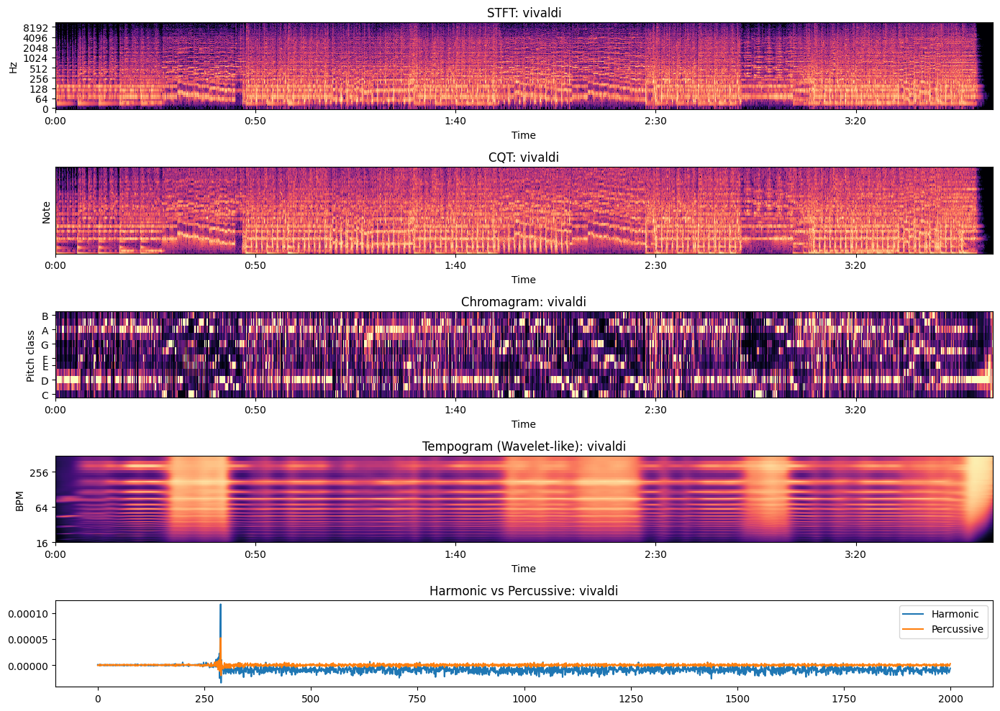

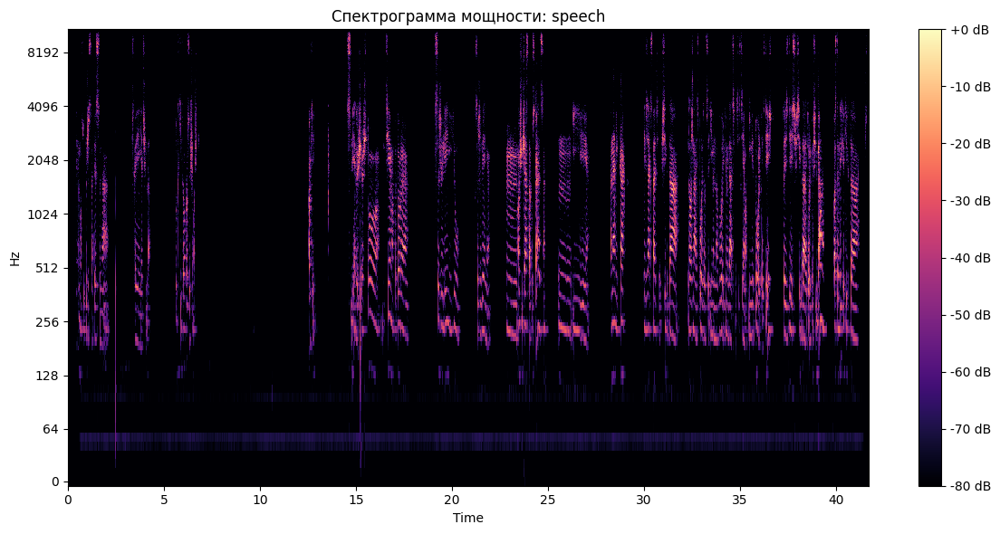

...

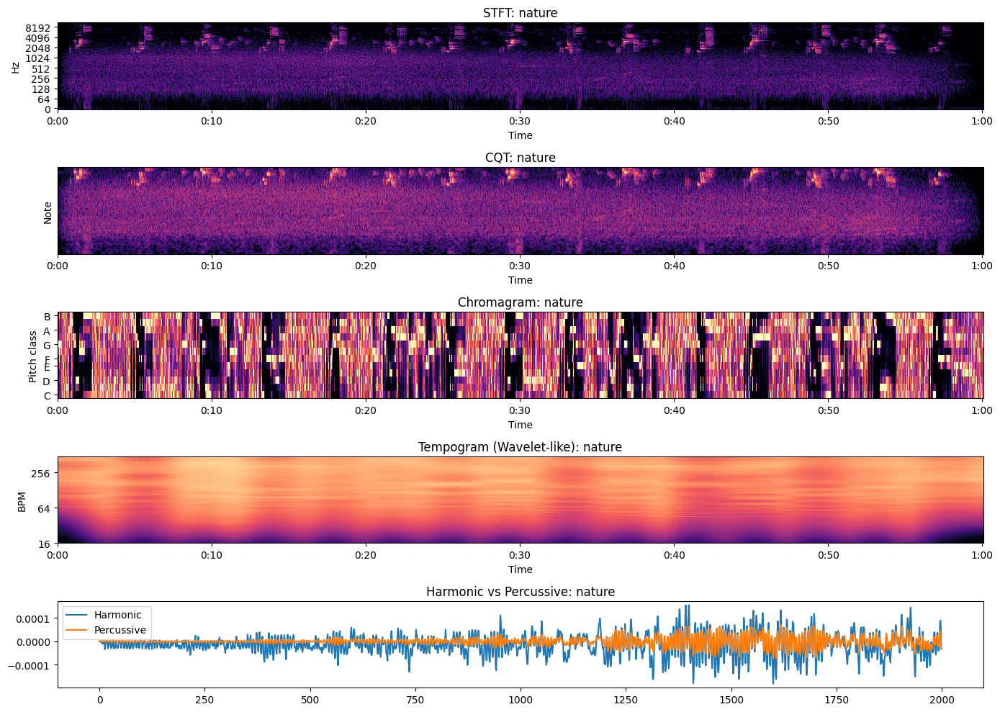

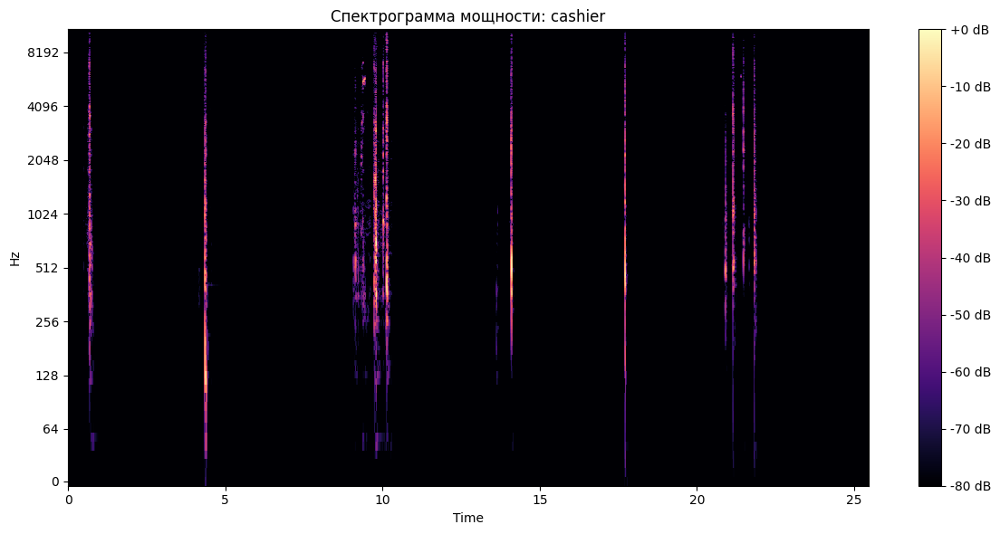

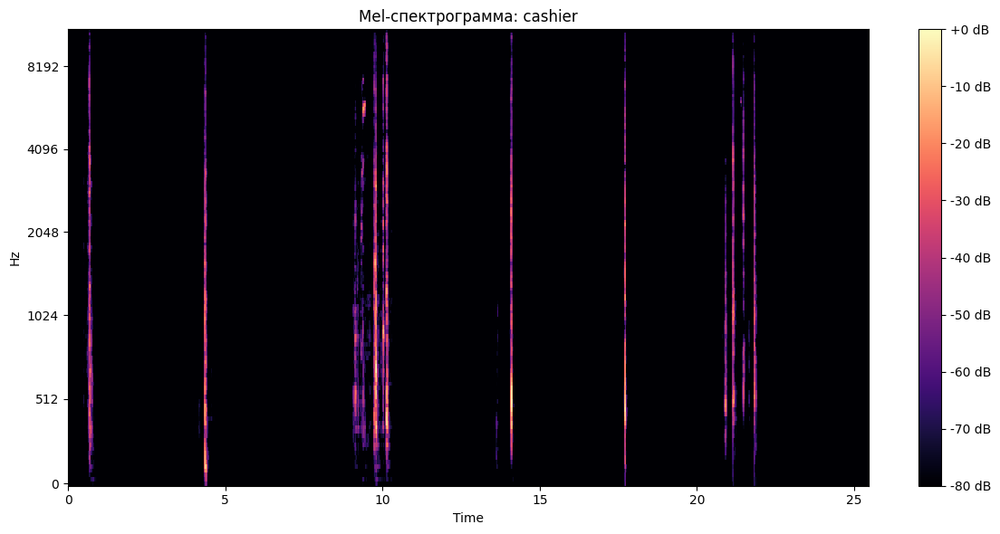

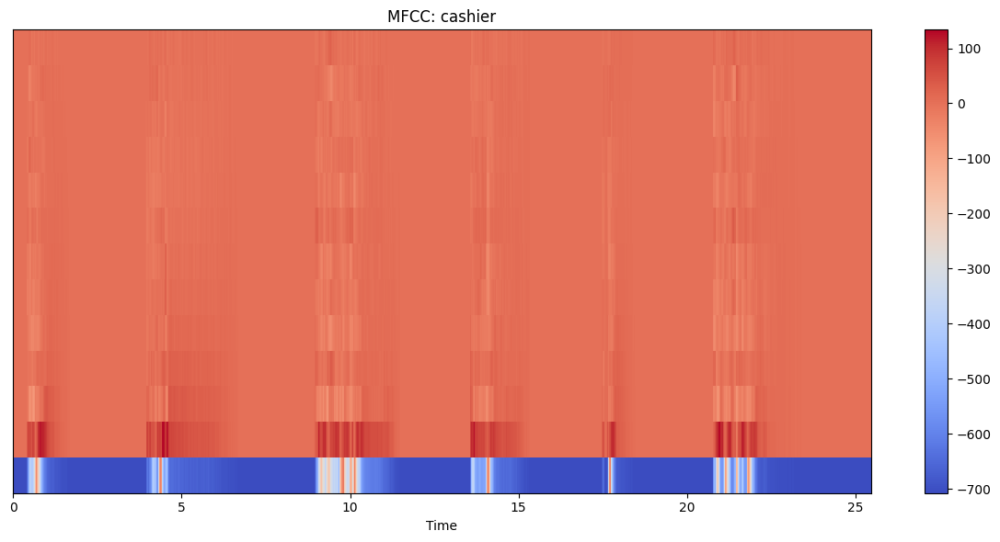

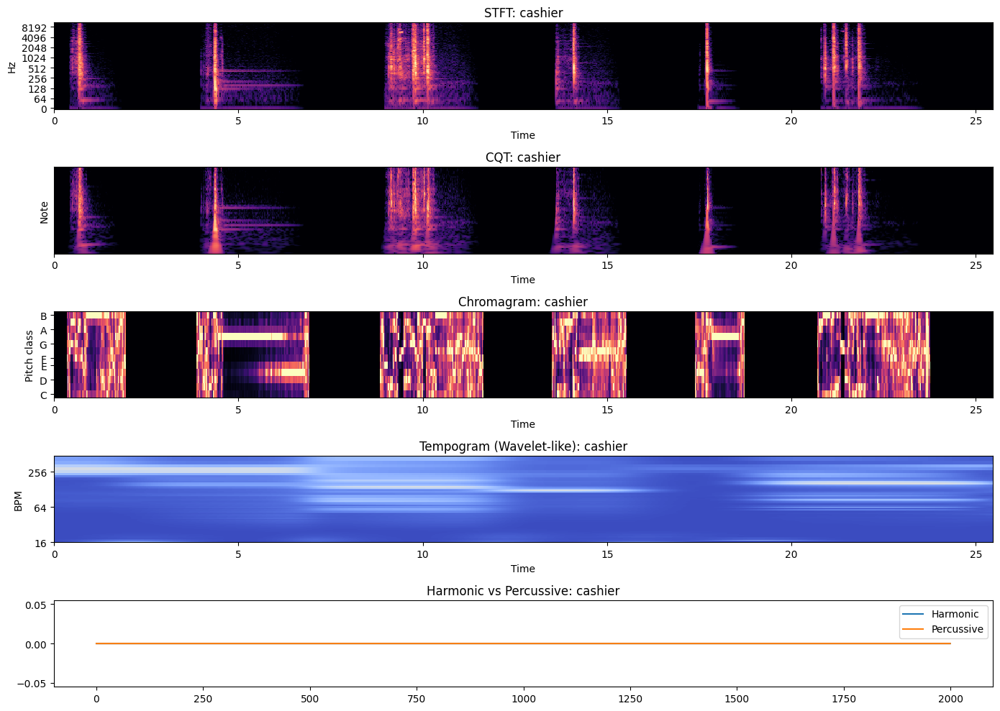

In [ ]:
for name, (y, sr) in signals.items():
    plot_power_spectrogram(y, sr, name)
    plot_mel_spectrogram(y, sr, name)
    plot_mfcc(y, sr, name)
    signal_decompositions(y, sr, name)

In [ ]:
import soundfile as sf

In [ ]:
# Удаление шума (для аудио speech)
# Принцип - спектральное вычитание (вычисляем спектр шума и вычитаем его (шум) из сигнала)
stft = librosa.stft(y)
magnitude, phase = np.abs(stft), np.angle(stft) # амплитуда спектра (на кажд.частоте + фаза для восстановления сигнала)

# Оценка шума (первые полсекунды - шумовой профиль)
noise_frames = int(0.5*sr / 512)
noise_profile = np.mean(magnitude[:, :noise_frames], axis=1, keepdims=True)

# Спектральное вычитание
clean_magnitude = np.maximum(magnitude - noise_profile, 0)

# Обратное преобразование
clean_stft = clean_magnitude * np.exp(1j * phase)
clean_audio = librosa.istft(clean_stft)

sf.write('clean_speech.wav', clean_audio, sr)